In [33]:
import sys
root_dir = '../'
sys.path.append(root_dir)
sys.path.append(root_dir + 'Data/corner/scripts')

import os
import gc
import psutil
import matplotlib
# matplotlib.use('agg') # so that plt works in command line
import numpy as np
import matplotlib.pyplot as plt
import sklearn.ensemble as sken
import sklearn.decomposition as skdc
import sklearn.manifold as skmf
import Data_Feeder as feeder

# corner radar data

In [3]:
data_path = root_dir + 'Data/corner/dw_19991231_162610_0.000000_0.000000/'
class_num = 2
line_re = '\t (?!3).*' # only corner radar
select_cols = None # all cols

dataset = feeder.Corner_Radar_Points_Gen_Feeder(data_path, 
                                                class_num=class_num, 
                                                use_onehot=False, 
                                                line_re=line_re, 
                                                select_cols=select_cols)
points, labels = dataset.get_all_data(allowed=True)
points = np.vstack(points)
labels = np.concatenate(labels)

In [4]:
points_idx = {'all':np.arange(points.shape[0]),
              'car':np.where(labels == 1),
              'other':np.where(labels == 0),
             }
feature_len = points.shape[1]
headers = "group_id,target_id,x,y,angle,distance,speed,rcs,v_x,v_y,lat_v,acceration,track_width,group_changing,is_bridge,range_mode,track_oncoming,rolling_count".split(',')
short_header = "gid,tid,x,y,agl,dist,spd,rcs,v_x,v_y,lat_v,acc,tr_w,g_ch,is_b,rm,tr_on,rc".split(',')
save_dir = './result/corner/'

## data hist

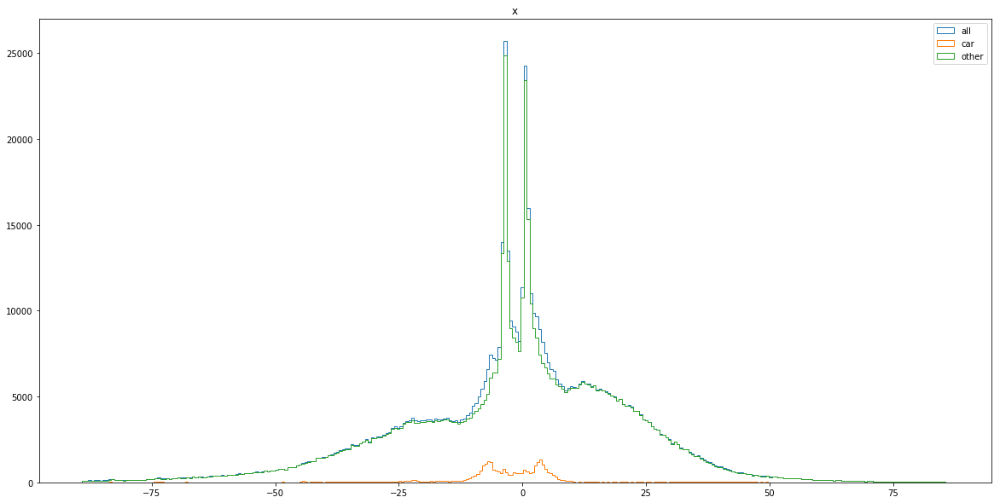

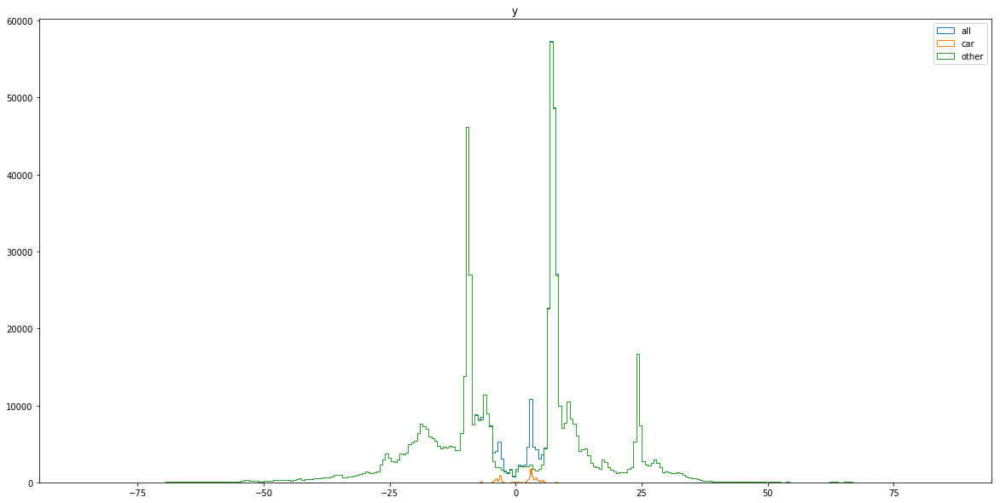

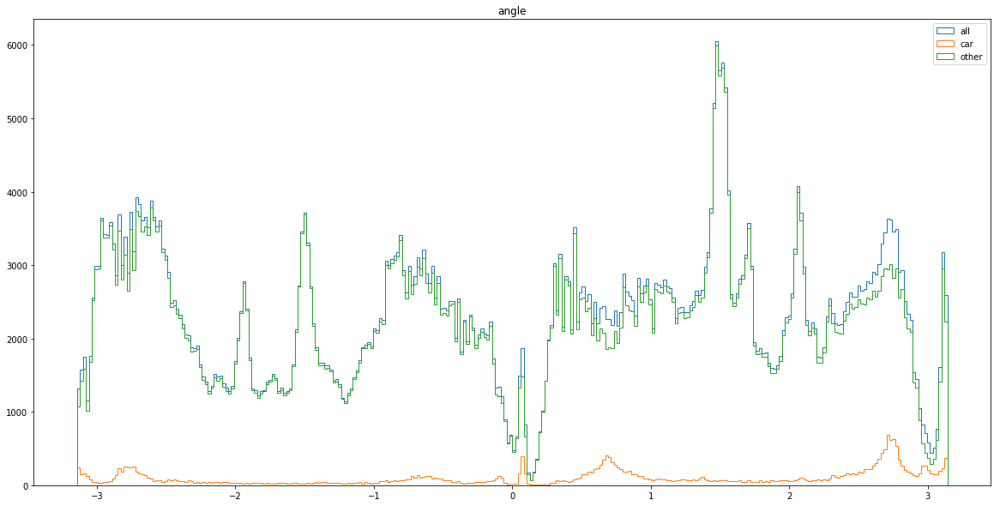

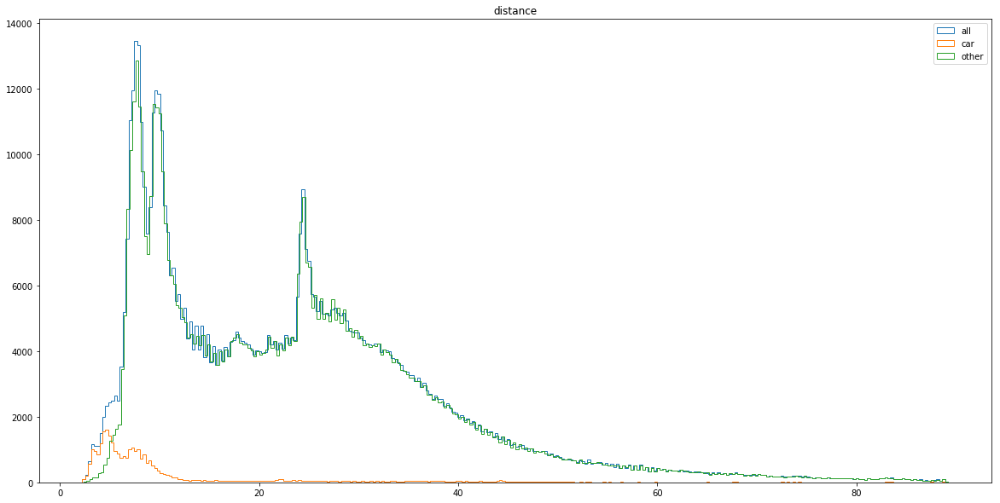

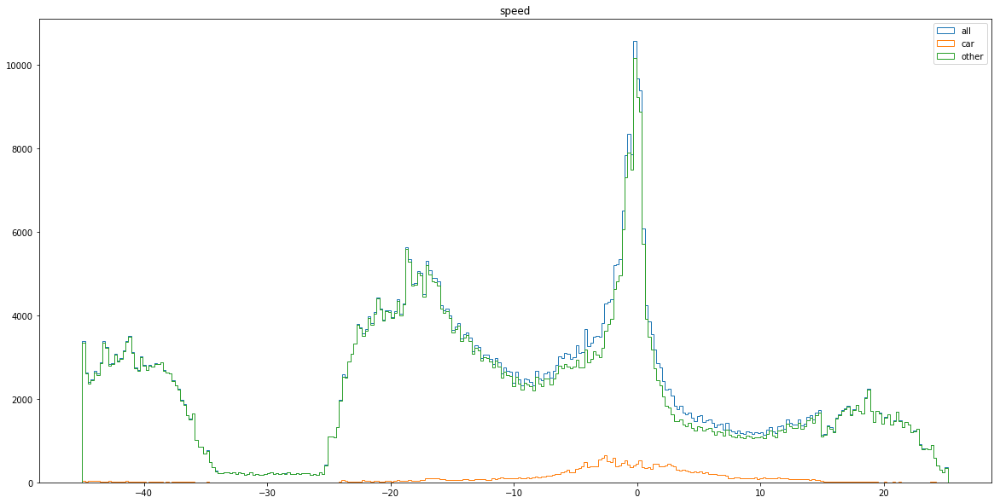

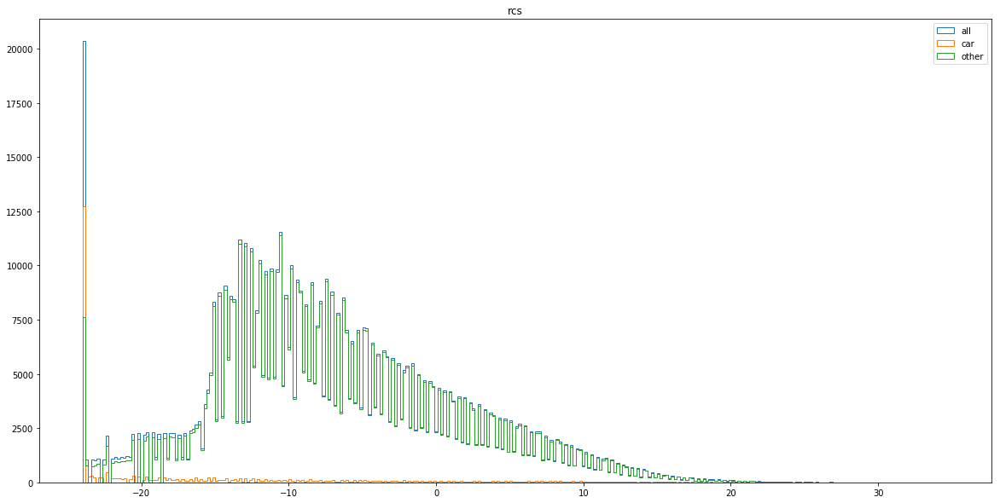

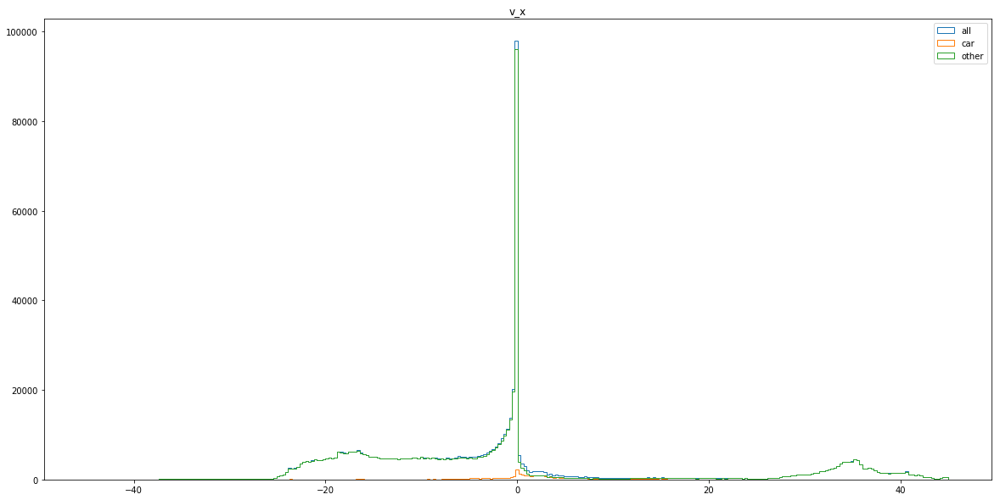

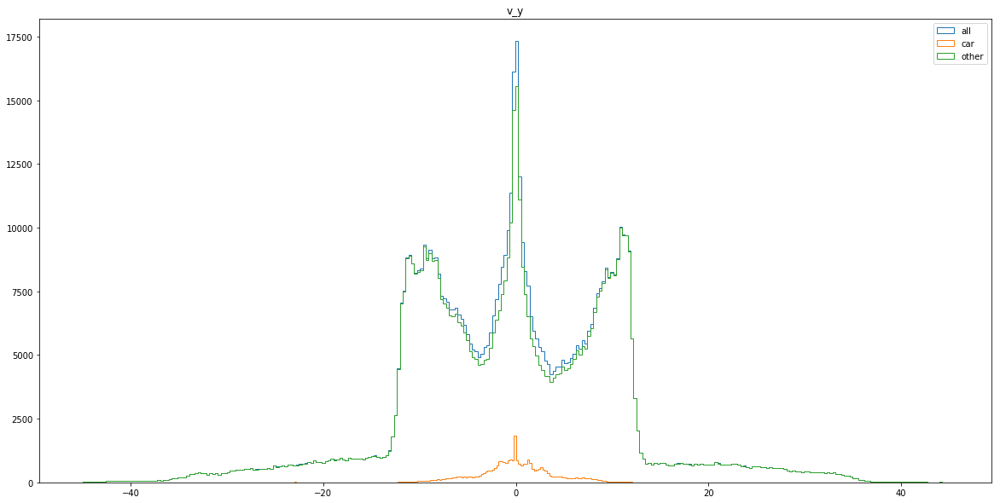

In [148]:
plt.close('all')
for col_idx in range(2,10):
    cur_feature_arr = points[:,col_idx]

    plt.figure(figsize=(20, 10))
    plt.title(headers[col_idx])
    
    for points_class, cur_points_idx in points_idx.items():
        cur_points = cur_feature_arr[cur_points_idx]    

        plt.hist(cur_points, bins=300, histtype='step', density=False, label=points_class)
    plt.legend()
    plt.savefig(save_dir + 'feature_hist_cnt_' + headers[col_idx] + '.png')
    
    plt.show()
    plt.close()

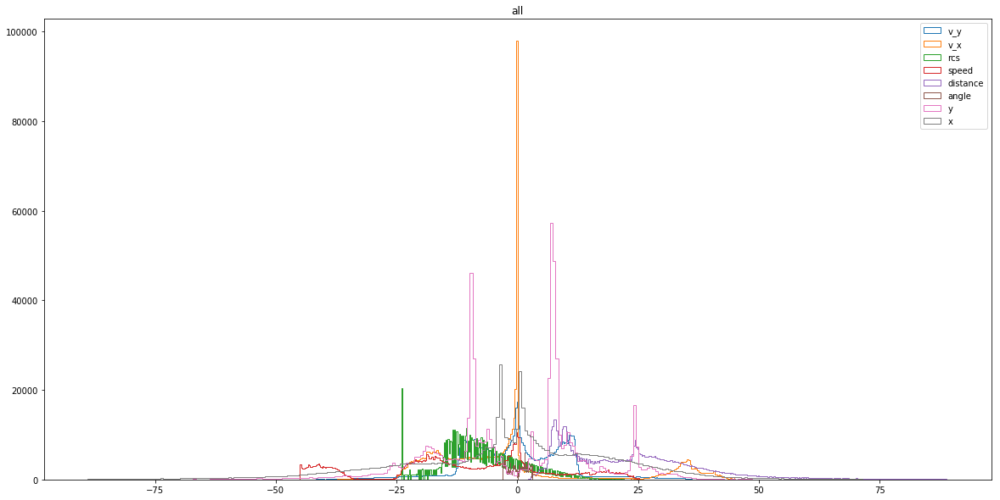

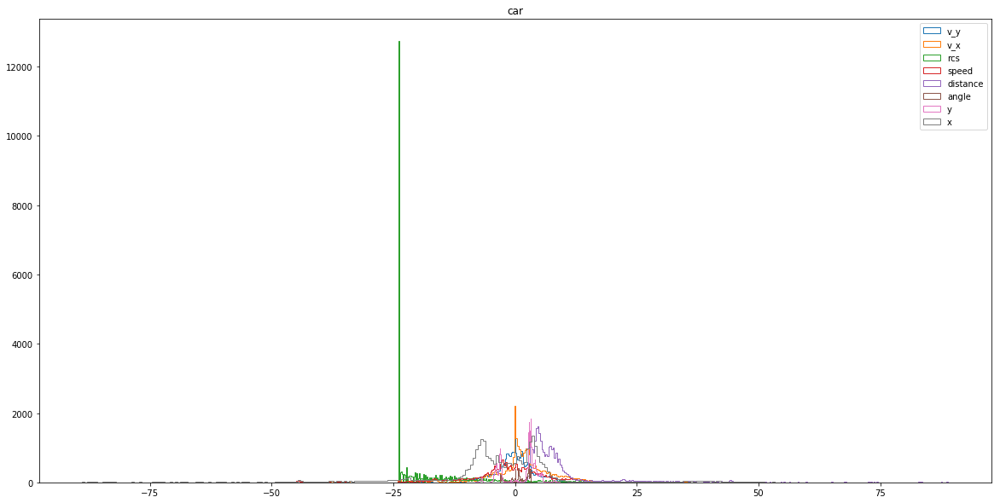

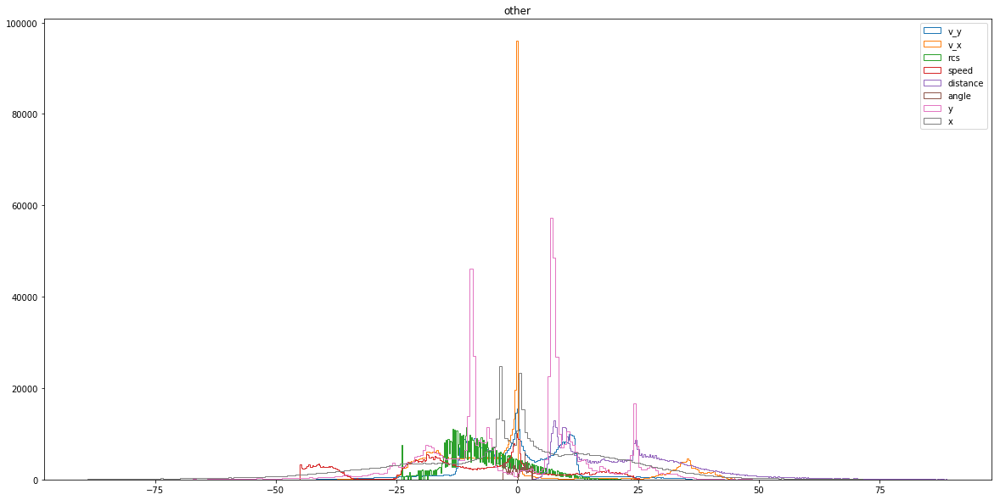

In [146]:
plt.close('all')
for points_class, cur_points_idx in points_idx.items():
    plt.figure(figsize=(20, 10))
    plt.title(points_class)
    
    cur_points = points[cur_points_idx].copy()
#     cur_points -= cur_points.mean(axis=0)
#     cur_points /= cur_points.std(axis=0)
#     cur_points[np.where(cur_points != cur_points)] = 0
    
    for col_idx in reversed(range(2,10)):
        cur_feature_arr = cur_points[:,col_idx]

        plt.hist(cur_feature_arr, bins=300, histtype='step', label=headers[col_idx])
    plt.legend()

    plt.show()
    plt.close()

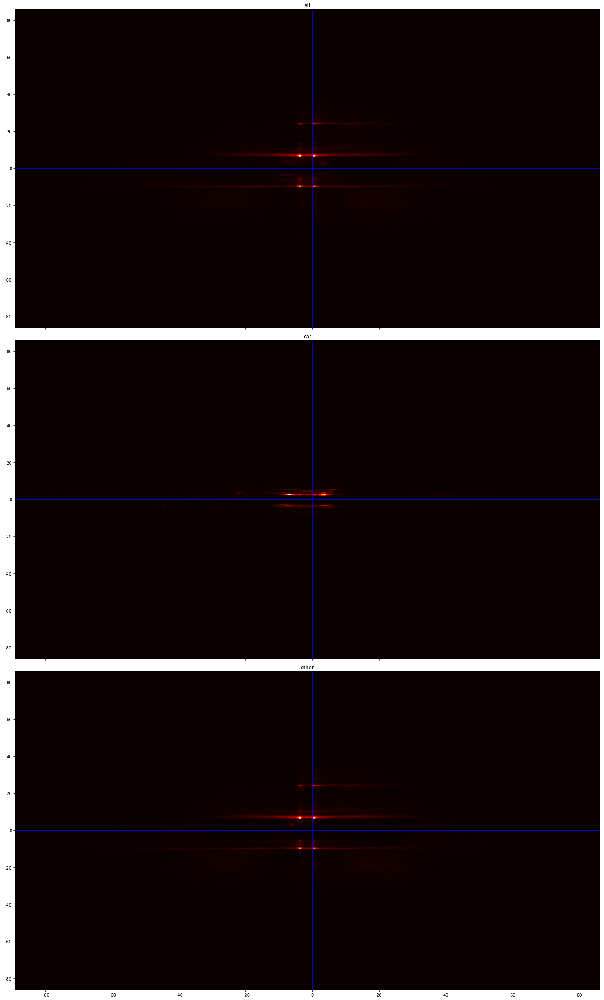

In [19]:
idx_x = 2
idx_y = 3

plt.close('all')
fig, axes = plt.subplots(nrows=3, ncols=1, sharex=True, sharey=True, figsize=(20,33))

# already after transformed
coord_x = points[:,idx_x]
coord_y = points[:,idx_y]
plt_range = [[min(coord_x), max(coord_x)],[min(coord_y), max(coord_y)]]

for points_class, ax in zip(points_idx.keys(), axes):
    cur_points_idx = points_idx[points_class]
    cur_x = coord_x[cur_points_idx]
    cur_y = coord_y[cur_points_idx]
    
    ax.set_title(points_class)
    ax.hist2d(x = cur_x, y = cur_y, bins=300, cmap='hot', range=plt_range)
    ax.vlines(x=0, ymin=min(points[:,idx_y]), ymax=max(points[:,idx_y]), colors='b')
    ax.hlines(y=0, xmin=min(points[:,idx_x]), xmax=max(points[:,idx_x]), colors='b')
    
fig.tight_layout()

for points_class, ax in zip(points_idx.keys(), axes):
    subplot = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    subplot = subplot.expanded(1.2, 1.05) # Pad the saved area by 20% in x-direction and 5% in y-direction
    
    save_path = save_dir + 'xy-2D_hist_' + points_class + '.png'
    fig.savefig(save_path, bbox_inches=subplot)

plt.show()
plt.close()

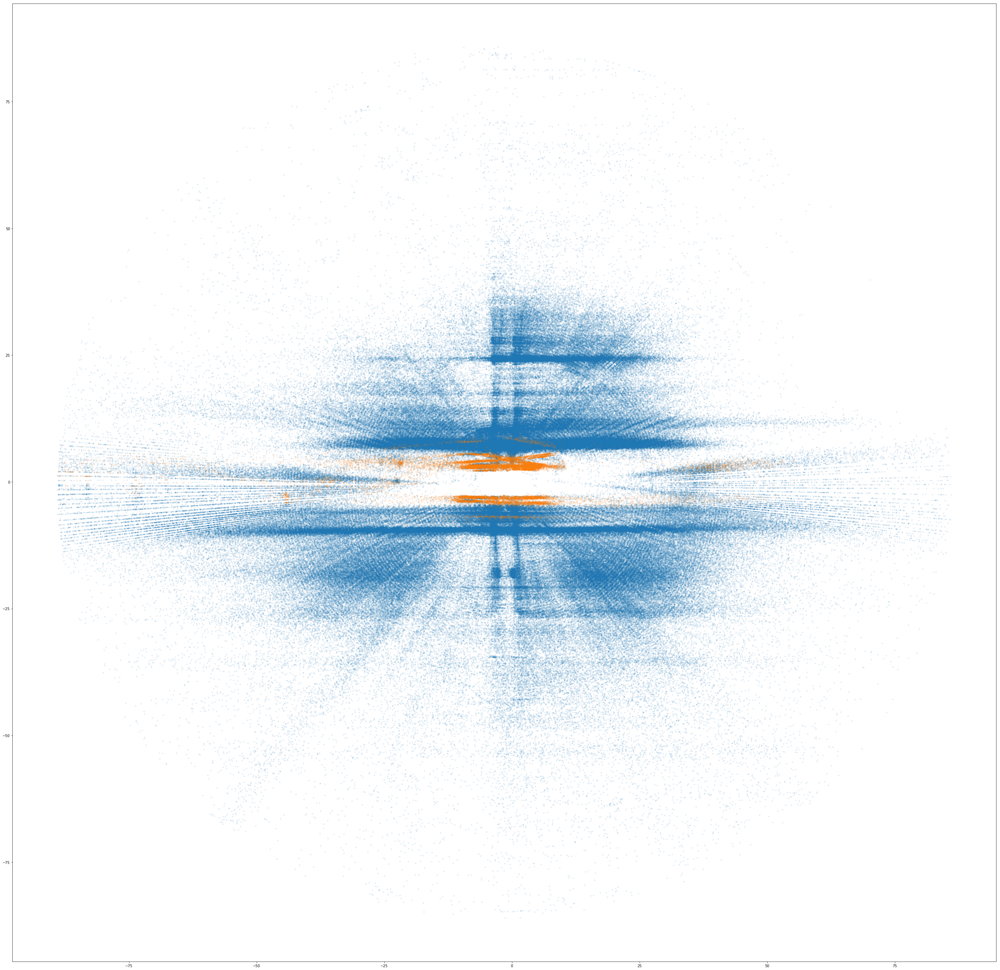

In [41]:
idx_x = 2
idx_y = 3

coord_x = points[:,idx_x]
coord_y = points[:,idx_y]
    
plt.close('all')
plt.figure(figsize=(50,50))
plt.scatter(coord_x[points_idx['other']], coord_y[points_idx['other']], marker='.', label='other', alpha=0.1)
plt.scatter(coord_x[points_idx['car']], coord_y[points_idx['car']], marker='.', label='car', alpha=0.1)
    
save_path = save_dir + 'xy-2D.png'
plt.savefig(save_path, bbox_inches='tight')

plt.show()
plt.close()

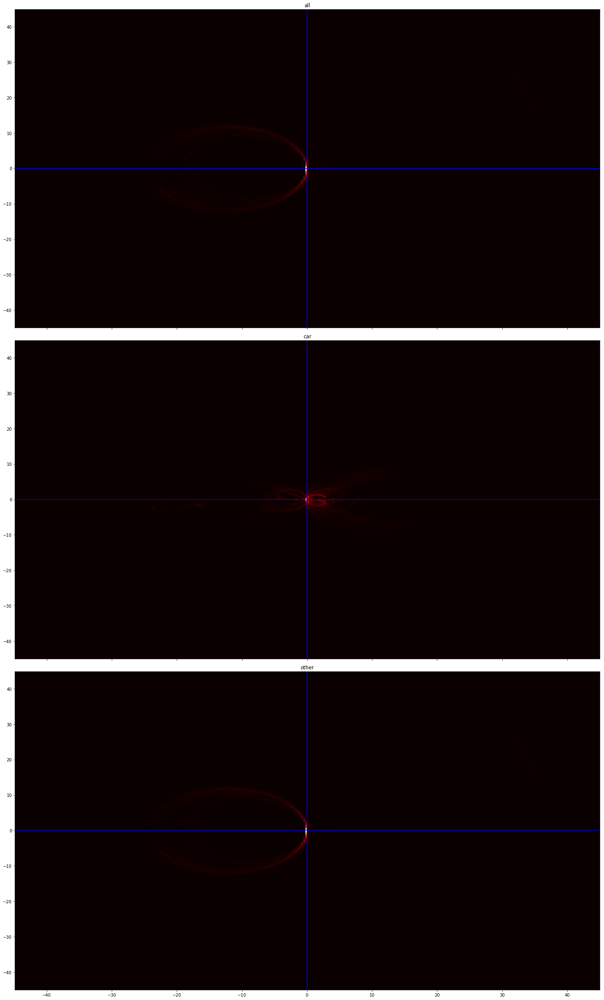

In [20]:
idx_x = 8
idx_y = 9

plt.close('all')
fig, axes = plt.subplots(nrows=3, ncols=1, sharex=True, sharey=True, figsize=(20,33))

# already after transformed
coord_x = points[:,idx_x]
coord_y = points[:,idx_y]
plt_range = [[min(coord_x), max(coord_x)],[min(coord_y), max(coord_y)]]

for points_class, ax in zip(points_idx.keys(), axes):
    cur_points_idx = points_idx[points_class]
    cur_x = coord_x[cur_points_idx]
    cur_y = coord_y[cur_points_idx]
    
    ax.set_title(points_class)
    ax.hist2d(x = cur_x, y = cur_y, bins=300, cmap='hot', range=plt_range)
    ax.vlines(x=0, ymin=min(points[:,idx_y]), ymax=max(points[:,idx_y]), colors='b')
    ax.hlines(y=0, xmin=min(points[:,idx_x]), xmax=max(points[:,idx_x]), colors='b')
    
fig.tight_layout()

for points_class, ax in zip(points_idx.keys(), axes):
    subplot = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    subplot = subplot.expanded(1.2, 1.05) # Pad the saved area by 20% in x-direction and 5% in y-direction
    
    save_path = save_dir + 'v_xy-2D_hist_' + points_class + '.png'
    fig.savefig(save_path, bbox_inches=subplot)

plt.show()
plt.close()

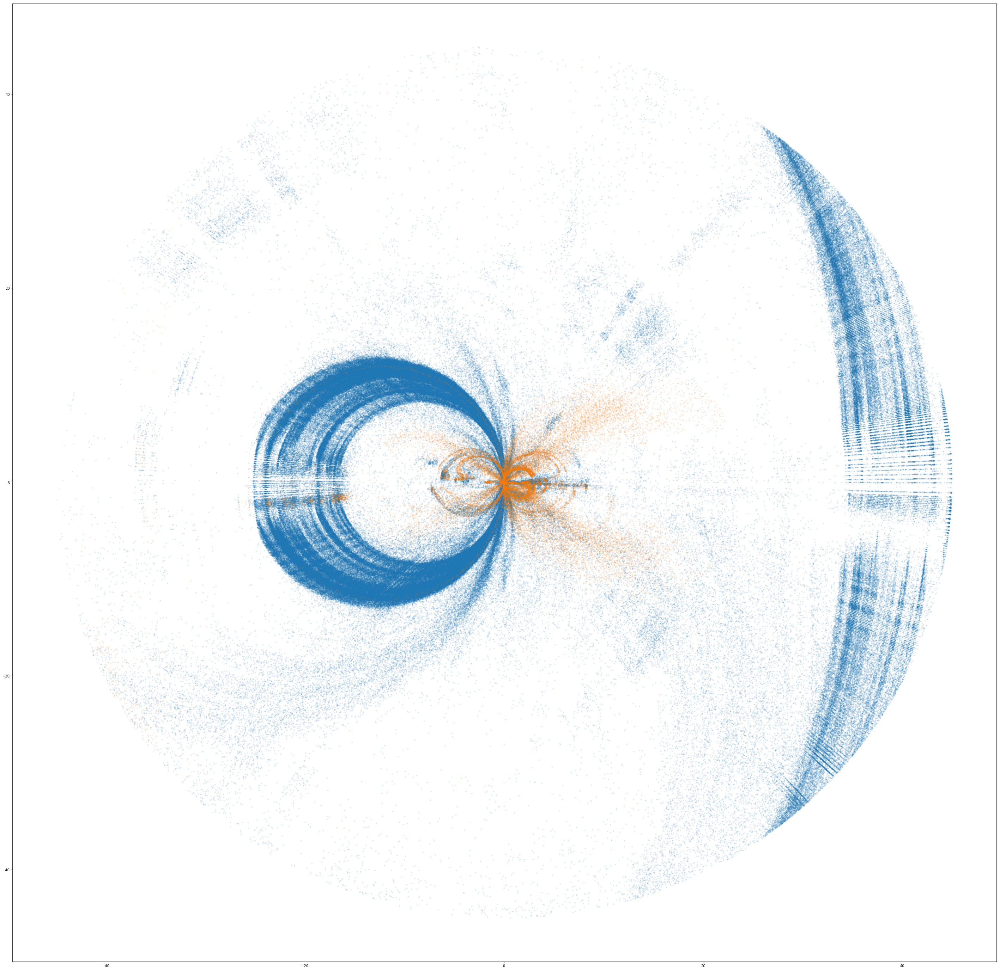

In [40]:
idx_x = 8
idx_y = 9

coord_x = points[:,idx_x]
coord_y = points[:,idx_y]
    
plt.close('all')
plt.figure(figsize=(50,50))
plt.scatter(coord_x[points_idx['other']], coord_y[points_idx['other']], marker='.', label='other', alpha=0.1)
plt.scatter(coord_x[points_idx['car']], coord_y[points_idx['car']], marker='.', label='car', alpha=0.1)
    
save_path = save_dir + 'v_xy-2D.png'
plt.savefig(save_path, bbox_inches='tight')

plt.show()
plt.close()

## PCA

In [245]:
cur_headers = headers[2:]
cur_short_header=short_header[2:]
cur_points = points[:,2:].copy()

cur_points = cur_points - cur_points.mean(axis=0)
cur_points = cur_points / cur_points.std(axis=0)
cur_points[np.where(cur_points != cur_points)] = 0 # remove NaN
print('after std:', cur_points.mean(axis=0), cur_points.std(axis=0))


pca = skdc.PCA(whiten=False)
pca.fit(cur_points)
print(cur_points.shape)

/home/tangliyao/miniconda3/envs/tf_gpu_pip/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  


after std: [ 2.79353480e-16 -8.34721266e-16 -5.97337934e-16  6.82624184e-14
 -1.56306139e-14 -5.49095372e-16  1.21981509e-16  3.03666529e-16
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00] [1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
(698782, 16)


In [246]:
print(headers)
print()
print('%-5.2f' % pca.noise_variance_, end=' ')
for n in cur_short_header:
    print('%-6s' % n, end='')
print()
for eigen_vec, ratio in zip(pca.components_, pca.explained_variance_ratio_):
    print('%-5.2f' % ratio, end=':')
#     densified_eigen_vec = (eigen_vec - min(eigen_vec)) / sum(eigen_vec - min(eigen_vec))
    for n in eigen_vec:
        if abs(n) > 1e-5:
            print('%-6.2f' % n, end='')
        else:
            print('      ', end='')
    print()

['group_id', 'target_id', 'x', 'y', 'angle', 'distance', 'speed', 'rcs', 'v_x', 'v_y', 'lat_v', 'acceration', 'track_width', 'group_changing', 'is_bridge', 'range_mode', 'track_oncoming', 'rolling_count']

0.00  x     y     agl   dist  spd   rcs   v_x   v_y   lat_v acc   tr_w  g_ch  is_b  rm    tr_on rc    
0.29 :-0.26 -0.49 -0.49 0.40  -0.22 0.15  0.27  0.38                                                  
0.23 :-0.37 0.36  0.30  0.16  -0.42 0.25  0.55  -0.29                                                 
0.16 :0.40  0.08  0.03  0.48  -0.12 0.65  -0.40 -0.13                                                 
0.13 :-0.58 0.05  -0.14 0.15  0.68  0.25  -0.13 -0.28                                                 
0.08 :0.08  -0.19 -0.34 0.20  -0.21 -0.39 -0.07 -0.77                                                 
0.06 :-0.07 0.15  0.36  0.71  0.11  -0.52 -0.10 0.22                                                  
0.04 :0.00  -0.75 0.62  -0.03 0.09  0.11  0.09  -0.18                    

In [247]:
for i in np.arange(cur_points.shape[1]):
    print('%.5f' % sum(pca.explained_variance_ratio_[:i+1]), end=' ')

0.28652 0.51733 0.67591 0.80386 0.88436 0.94736 0.98303 1.00000 1.00000 1.00000 1.00000 1.00000 1.00000 1.00000 1.00000 1.00000 

/home/tangliyao/miniconda3/envs/tf_gpu_pip/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in true_divide
  import sys


[0.28651534 0.23081435]


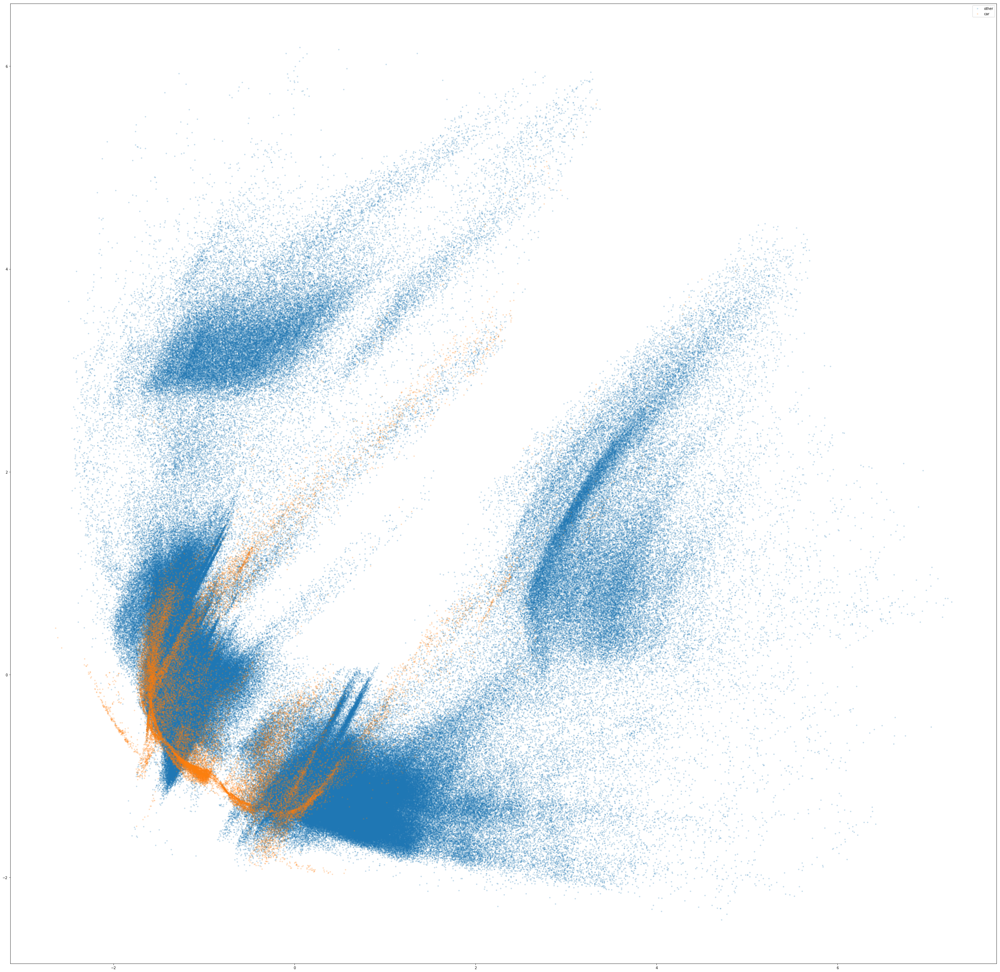

In [62]:
cur_headers = headers[2:]
cur_short_header=short_header[2:]
cur_points = points[:,2:].copy()

# standardize
cur_points = cur_points - cur_points.mean(axis=0)
cur_points = cur_points / cur_points.std(axis=0)
cur_points[np.where(cur_points != cur_points)] = 0 # remove NaN

pca = skdc.PCA(n_components=2, whiten=False)
cur_points = pca.fit_transform(cur_points)
print(pca.explained_variance_ratio_)

plt.close('all')
plt.figure(figsize=(50,50))
plt.scatter(cur_points[points_idx['other'],0], cur_points[points_idx['other'],1], marker='.', label='other', alpha=0.2)
plt.scatter(cur_points[points_idx['car'],0], cur_points[points_idx['car'],1], marker='.', label='car', alpha=0.2)
plt.legend()
plt.savefig(save_dir + 'pca_plot_raw.png')
plt.show()
plt.close()

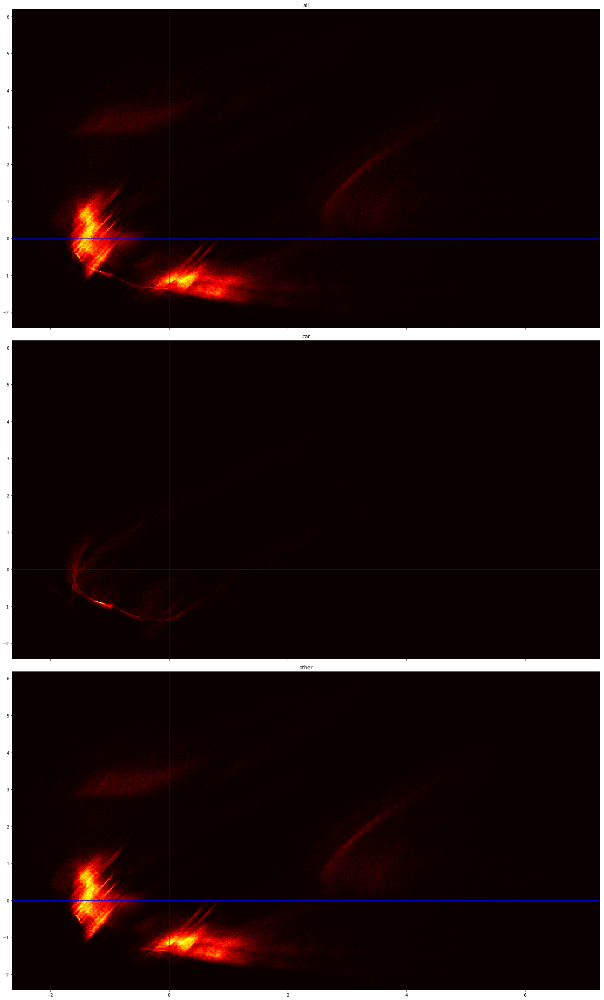

In [18]:
plt.close('all')
fig, axes = plt.subplots(nrows=3, ncols=1, sharex=True, sharey=True, figsize=(20,33))

# already after transformed
coord_x = cur_points[:,0]
coord_y = cur_points[:,1]
plt_range = [[min(coord_x), max(coord_x)],[min(coord_y), max(coord_y)]]

for points_class, ax in zip(points_idx.keys(), axes):
    cur_points_idx = points_idx[points_class]
    cur_x = coord_x[cur_points_idx]
    cur_y = coord_y[cur_points_idx]
    
    ax.set_title(points_class)
    ax.hist2d(x = cur_x, y = cur_y, bins=500, cmap='hot', range=plt_range)
    ax.vlines(x=0, ymin=min(coord_y), ymax=max(coord_y), colors='b')
    ax.hlines(y=0, xmin=min(coord_x), xmax=max(coord_x), colors='b')
    
fig.tight_layout()

for points_class, ax in zip(points_idx.keys(), axes):
    subplot = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    subplot = subplot.expanded(1.2, 1.05) # Pad the saved area by 20% in x-direction and 5% in y-direction
    
    save_path = save_dir + 'pca_distr' + points_class + '.png'
    fig.savefig(save_path, bbox_inches=subplot)

plt.show()
plt.close()

## T-SNE

In [65]:
postifx = 'raw'
cur_headers = headers[2:10]
cur_short_header=short_header[2:10]
cur_points = points[:,2:10].copy()

# # standardize
# cur_points = cur_points - cur_points.mean(axis=0)
# cur_points = cur_points / cur_points.std(axis=0)
# cur_points[np.where(cur_points != cur_points)] = 0 # remove NaN

tsne = skmf.TSNE()
gc.collect()
cur_points = tsne.fit_transform(cur_points)

# raw
plt.close('all')
plt.figure(figsize=(50,50))
plt.scatter(cur_points[points_idx['other'],0], cur_points[points_idx['other'],1], marker='.', label='other', alpha=0.1)
plt.scatter(cur_points[points_idx['car'],0], cur_points[points_idx['car'],1], marker='.', label='car', alpha=0.1)
plt.legend()
plt.savefig(save_dir + 'tsne_plot_' + postifx + '.png')
plt.show()
plt.close()

plt.close('all')
fig, axes = plt.subplots(nrows=3, ncols=1, sharex=True, sharey=True, figsize=(20,33))

# already after transformed
coord_x = cur_points[:,0]
coord_y = cur_points[:,1]
plt_range = [[min(coord_x), max(coord_x)],[min(coord_y), max(coord_y)]]

for points_class, ax in zip(points_idx.keys(), axes):
    cur_points_idx = points_idx[points_class]
    cur_x = coord_x[cur_points_idx]
    cur_y = coord_y[cur_points_idx]
    
    ax.set_title(points_class)
    ax.hist2d(x = cur_x, y = cur_y, bins=500, cmap='hot', range=plt_range)
    ax.vlines(x=0, ymin=min(coord_y), ymax=max(coord_y), colors='b')
    ax.hlines(y=0, xmin=min(coord_x), xmax=max(coord_x), colors='b')
    
fig.tight_layout()

for points_class, ax in zip(points_idx.keys(), axes):
    subplot = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    subplot = subplot.expanded(1.2, 1.05) # Pad the saved area by 20% in x-direction and 5% in y-direction
    
    save_path = save_dir + 'tsne_distr_' + postifx + '_' + points_class + '.png'
    fig.savefig(save_path, bbox_inches=subplot)

plt.show()
plt.close()

KeyboardInterrupt: 